In [409]:
import pandas as pd
import numpy as np

import plotly.graph_objects as go

# 1. Вложение с задержкой

Идея в том, чтобы нарисовать фазовые траектории модели, а затем только по наблюдаемой (одной из) восстановить всю картину. Реконструкция должна дать нам схожий геометрический объект.

## 1.1. Решение системы ДУ

In [410]:
from scipy.integrate import odeint

В качестве примера используем аттрактор Рёсслера с заданными ${alpha}$, ${beta}$, ${sigma}$. 

In [411]:
alpha = 0.2
beta = 0.2
sigma = 5.7

def roessler(xyz, time, 
             alpha, beta, sigma):
    
    x, y, z = xyz
    
    xdt = -(y + z)
    ydt = x + alpha*y
    zdt = beta + z*(x - sigma)
    
    return xdt, ydt, zdt

Зададим начальные условия:

In [412]:
x0, y0, z0 = 1, 1, 1

Проинтегрируем:

In [413]:
timemax, N = 300, 50000

time = np.linspace(0, timemax, N)

space = odeint(roessler, (x0, y0, z0), 
               time,
               args=(alpha, beta, sigma))

x, y, z = space.T

In [414]:
def plot_space(x, y, z):
    scatter = go.Scatter3d(x=x, y=y, z=z,
                    line=dict(color='black',
                              width=1,
                              ),
                    mode='lines')

    fig = go.Figure(scatter)    


    fig.update_layout(

                      scene=dict(
                                 xaxis=dict(visible=False),
                                 yaxis=dict(visible=False),
                                 zaxis=dict(visible=False)
                                )
                     )

    fig.show()

In [415]:
plot_space(x, y, z)

## 1.2. Реконструкция

Теперь предположим, что известнен только временной ряд ${x}$ (в коде также обозначен как ${ts}$).
Попробуем с помощью time delay embedding восстановить геометрическую картину порождающей его системы. Для этого импортируем класс PackardTransformer.

_Packard, N.H., Crutchfield, J.P., Farmer, J.D. & Shaw, R.S. (1980). 'Geometry from a Time Series'. Physical Review Letters, 45(9), pp.712-716_

In [416]:
from lm import PackardTransformer

In [417]:
ts = x.reshape(1, -1)
xyz = PackardTransformer(delay=100, dim=3).fit_transform(ts)[0]

plot_space(xyz[2], xyz[1], xyz[0])

Сравнив два рисунка, можно увидеть, что получено два эквивалентных многообразия.

# 2. Примеры построения матриц X, y соседей

Основная часть алгоритма состоит из реконструкции и поиска соседей в полученном пространстве.
Далее для моделирования необходимо зафиттить результаты поиска, но не совсем очевидно как выбирать вектор откликов ${y}$.

In [418]:
from lm import LocalModel

ts = np.array([[2, 3, 1, 2, 4, 3, 5, 3, 4, 7, 8, 4, 5, 9]])

Создадим инстанс класса LocalModel с 4-мя соседями:

In [419]:
local = LocalModel(dim=3, delay=1, n_neighbors=4)

Построим для ${ts}$ фазовое пространство. Можно заметить, что последняя строка матрицы ${ps}$ содержит последнее (прогнозируемое) значение вр. ряда - ${9}$:

In [420]:
ps = PackardTransformer(dim=3, delay=1).fit_transform(ts)
ps

array([[[2., 3., 1., 2., 4., 3., 5., 3., 4., 7., 8., 4.],
        [3., 1., 2., 4., 3., 5., 3., 4., 7., 8., 4., 5.],
        [1., 2., 4., 3., 5., 3., 4., 7., 8., 4., 5., 9.]]])

Используем приватную функцию _get_X_y(), которая ищет соседей и формирует вектор откликов ${y}$ и матрицу соседей ${X}$.
Задача прогнозирования сводится к тому, чтобы связать будущее значение (зачение временного ряда из последней строки) с предыдущим состоянием (3-х мерным вектором) так же из матрицы ${X}$.

In [421]:
Xy = [i for i in local._get_X_y(ps)][0]

X = Xy[0]
y = Xy[1]

X, y 

(array([[4., 7., 8., 1.],
        [3., 4., 7., 1.],
        [4., 3., 5., 1.],
        [5., 3., 4., 1.]]),
 array([[4.],
        [8.],
        [3.],
        [7.]]))

Ещё пример с ${dim = 4}$, ${delay = 2}$:

In [422]:
local2 = LocalModel(dim=4, delay=2, n_neighbors=4)
ps2 = PackardTransformer(dim=4, delay=2).fit_transform(ts)
ps2

array([[[2., 3., 1., 2., 4., 3., 5., 3.],
        [1., 2., 4., 3., 5., 3., 4., 7.],
        [4., 3., 5., 3., 4., 7., 8., 4.],
        [5., 3., 4., 7., 8., 4., 5., 9.]]])

In [423]:
Xy2 = [i for i in local2._get_X_y(ps2)][0]

X2= Xy2[0]
y2 = Xy2[1]

X2, y2

(array([[4., 5., 4., 8., 1.],
        [2., 3., 3., 7., 1.],
        [1., 4., 5., 4., 1.],
        [5., 4., 8., 5., 1.]]),
 array([[4.],
        [8.],
        [7.],
        [9.]]))

# 3. M4 competition

## 3.1 EDA

In [3]:
def load(train_path, test_path, freq):

    train = pd.read_csv(f'{train_path}/{freq}-train.csv').to_numpy()
    test = pd.read_csv(f'{test_path}/{freq}-test.csv').to_numpy()
    
    return train[:, 1:], test[:, 1:]

train_path='dataset/m4/train'
test_path='dataset/m4/test'

h = load(train_path, test_path, 'Hourly')
d = load(train_path, test_path, 'Daily')
w = load(train_path, test_path, 'Weekly')

m = load(train_path, test_path, 'Monthly')
q = load(train_path, test_path, 'Quarterly')
y = load(train_path, test_path, 'Yearly')

In [87]:
hf, df, wf, mf, qf, yf = pd.DataFrame(h[0]), pd.DataFrame(d[0]), pd.DataFrame(w[0]), pd.DataFrame(m[0]), pd.DataFrame(q[0]), pd.DataFrame(y[0])

In [88]:
hf_lens = hf.count(axis=1)
df_lens = df.count(axis=1)
wf_lens = wf.count(axis=1)

mf_lens = mf.count(axis=1)
qf_lens = qf.count(axis=1)
yf_lens = yf.count(axis=1)

[Text(0, 0.5, 'Число вр. рядов'),
 Text(0, 0.5, 'Число вр. рядов'),
 Text(0, 0.5, 'Число вр. рядов')]

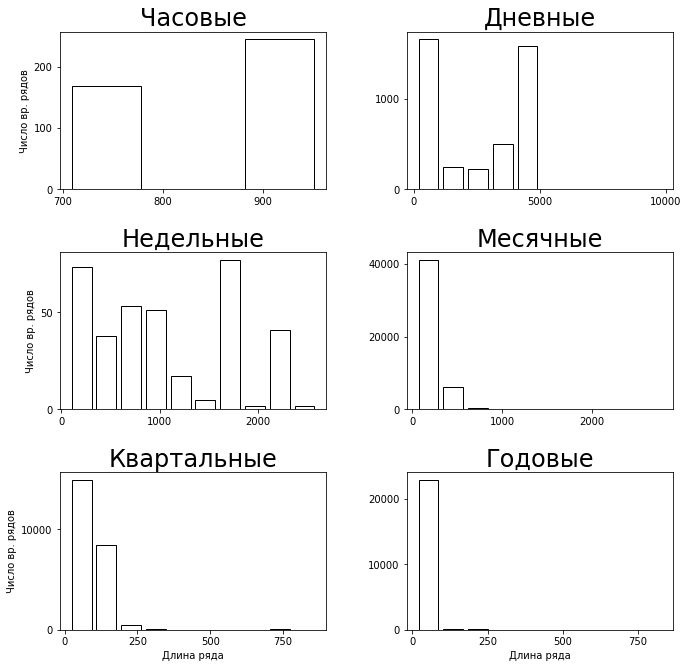

In [89]:
import matplotlib.pyplot as plt
import seaborn as sns

fig, axes = plt.subplots(3, 2, figsize=(11, 11))

plt.rc('font', family='Times New Roman', size=20)
plt.rcParams['axes.labelweight'] = 'normal'

plt.subplots_adjust(wspace=0.3, hspace=0.4)

hf_lens.hist(ax=axes[0][0], bins=3, edgecolor='k', facecolor='w', grid=False, rwidth=0.8)
df_lens.hist(ax=axes[0][1], bins=10, edgecolor='k', facecolor='w', grid=False, rwidth=0.8)
wf_lens.hist(ax=axes[1][0], bins=10, edgecolor='k', facecolor='w', grid=False, rwidth=0.8)

mf_lens.hist(ax=axes[1][1], bins=10, edgecolor='k', facecolor='w', grid=False, rwidth=0.8)
qf_lens.hist(ax=axes[2][0], bins=10, edgecolor='k', facecolor='w', grid=False, rwidth=0.8)
yf_lens.hist(ax=axes[2][1], bins=10, edgecolor='k', facecolor='w', grid=False, rwidth=0.8)

axes[0][0].set_title('Часовые')
axes[0][1].set_title('Дневные')
axes[1][0].set_title('Недельные')

axes[1][1].set_title('Месячные')
axes[2][0].set_title('Квартальные')
axes[2][1].set_title('Годовые')

plt.setp(axes[-1, :], xlabel='Длина ряда')
plt.setp(axes[:, 0], ylabel='Число вр. рядов')

## 3.2 Анализ прогнозов M4

In [90]:
import pandas as pd

m4ranks = pd.ExcelFile('dataset/m4/Evaluation and Ranks.xlsx')

m4 = {sheet_name: m4ranks.parse(sheet_name) 
          for sheet_name in m4ranks.sheet_names}

In [91]:
m4

{'Methods':    User ID Eligible for Prize First Name (1st author) Last Name (1st author)  \
 0      118                  Y                  Slawek                   Smyl   
 1      245                  Y                   Pablo          Montero-Manso   
 2      237                  Y                  Maciej            Pawlikowski   
 3       72                  Y                 Srihari             Jaganathan   
 4       69                  Y            Jose Augusto               Fiorucci   
 ..     ...                ...                     ...                    ...   
 56     Com                  N                       -                      -   
 57     MLP                  N                       -                      -   
 58     RNN                  N                       -                      -   
 59     ETS                  N                       -                      -   
 60   ARIMA                  N                       -                      -   
 
    Country (1s

In [92]:
m4.keys()

dict_keys(['Methods', 'Point Forecasts-Frequency', 'Point Forecasts-Domain', 'Point Forecasts-Summary', 'Prediction Intervals-Frequency', 'Prediction Intervals-Domain', 'Prediction Interval-Summary'])

In [93]:
m4forecasts = m4['Point Forecasts-Summary'].iloc[:, :-5]

m4forecasts.columns = ['id', 'name', 'cmp', 'type', 
               'smapeY', 'smapeQ', 'smapeM', 'smapeW', 'smapeD', 'smapeH', 'smapeTot',
               'maseY', 'maseQ', 'maseM', 'maseW', 'maseD', 'maseH', 'maseTot',
               'owaY', 'owaQ', 'owaM', 'owaW', 'owaD', 'owaH', 'owaTot']

m4forecasts = m4forecasts.drop(m4forecasts.index[0], axis=0).reset_index(drop=True)

In [94]:
m4forecasts = m4forecasts.iloc[:59, :]
m4forecasts

,id,name,cmp,type,smapeY,smapeQ,smapeM,smapeW,smapeD,smapeH,...,maseD,maseH,maseTot,owaY,owaQ,owaM,owaW,owaD,owaH,owaTot
0,118,"Smyl, S.",Uber Technologies,Hybrid,13.176,9.679,12.126,7.817,3.17,9.328,...,3.446,0.893,1.5357,0.77807,0.847207,0.836058,0.850844,1.04615,0.440143,0.820855
1,245,"Montero-Manso, P., Talagala, T., Hyndman, R. J...",University of A Coruña & Monash University,Combination (S & ML),13.528,9.733,12.639,7.625,3.097,11.506,...,3.344,0.819,1.55137,0.798905,0.847106,0.85807,0.795713,1.01861,0.483933,0.837702
2,237,"Pawlikowski, M., Chorowska, A. & Yanchuk, O.",ProLogistica Soft,Combination (S),13.943,9.796,12.747,6.919,2.452,9.611,...,2.642,0.873,1.54745,0.82041,0.855072,0.867458,0.766182,0.805617,0.443665,0.841261
3,72,"Jaganathan, S. & Prakash, P.",Individual,Combination (S & ML),13.712,9.809,12.487,6.814,3.037,9.934,...,3.258,0.976,1.57117,0.812839,0.859309,0.853743,0.795021,0.995636,0.473953,0.841967
4,69,"Fiorucci, J. A. & Louzada, F.",University of Brasilia & University of São Paulo,Combination (S),13.673,9.816,12.737,8.627,2.985,15.563,...,3.194,1.203,1.5538,0.80158,0.854886,0.868052,0.897214,0.977335,0.674447,0.842591
5,36,"Petropoulos, F. & Svetunkov, I.",University of Bath & Lancaster University,Combination (S),13.669,9.8,12.888,6.726,2.995,13.167,...,3.229,1.458,1.56543,0.805987,0.852701,0.876107,0.751147,0.984316,0.662514,0.847537
6,78,"Shaub, D.",Harvard Extension School,Combination (S),13.679,10.378,12.839,7.818,3.222,13.466,...,3.479,1.372,1.59537,0.800757,0.908121,0.881935,0.957309,1.05972,0.652692,0.860249
7,260,Legaki N. Z. & Koutsouri K.,National Technical University of Athens,Statistical,13.366,10.155,13.002,9.148,3.041,17.567,...,3.254,2.557,1.60104,0.787532,0.897995,0.904988,0.967602,0.995682,1.01163,0.860502
8,238,"Doornik, J., Hendry, D. & Castle, J.",University of Oxford,Combination (S),13.91,10,12.78,6.728,3.053,8.913,...,3.284,0.801,1.62662,0.836008,0.878193,0.880831,0.781685,1.00223,0.409648,0.864881
9,39,"Pedregal, D.J., Trapero, J. R., Villegas, M. A...",University of Castilla-La Mancha,Combination (S),13.821,10.093,13.151,8.989,3.026,9.765,...,3.232,1.049,1.61436,0.823597,0.88278,0.899333,0.938578,0.989864,0.484597,0.868696


In [95]:
ml = m4forecasts[m4forecasts['type']=='Machine Learning'].iloc[:, :-7]

In [96]:
for_mean = ml.drop(['smapeY', 'smapeQ', 'maseY', 'maseQ', 'smapeTot', 'maseTot'], axis=1)

In [97]:
for_mean.iloc[:, 4:8].median(axis=1)

22    11.2060
45    13.8490
53    17.5605
54    14.9590
55    11.7545
56    17.5955
dtype: float64

In [98]:
for_mean.iloc[:, 8:].median(axis=1)

22    2.0945
45    1.9820
53    6.7185
54    4.0900
55    2.2565
56    7.7900
dtype: float64

In [99]:
smape = m4forecasts.iloc[:, 4:10]
mase = m4forecasts.iloc[:, 11:17]

In [100]:
np.median([15.624, 8.918, 3.05, 11.428])

10.173

In [101]:
mase_mean = mase.mean(axis=0)
smape_mean = smape.mean(axis=0)

Text(0, 0.5, '')

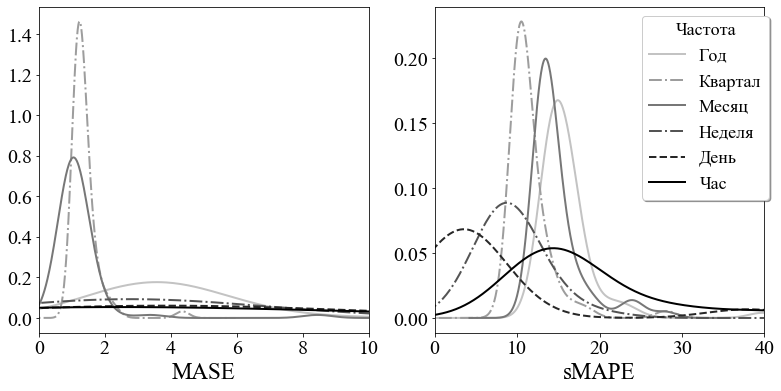

In [102]:
fig, axes = plt.subplots(1, 2, figsize=(13, 6))

plt.rc('font', family='Times New Roman', size=18)
plt.rcParams['axes.labelweight'] = 'normal'

styles = ['-', '-.', '-', '-.', '--', '-']
colors = list(plt.cm.Greys(np.linspace(0.35, 1, 6)))

mase.plot(ax=axes[0], kind='density', 
          color=colors, linewidth=2, style=styles, legend=False)

smape.plot(ax=axes[1], kind='density', 
           color=colors, linewidth=2, style=styles, legend=False)

plt.legend(loc="upper left", bbox_to_anchor=[0.6, 1], labels=['Год', 'Квартал', 'Месяц', 'Неделя', 'День', 'Час'],
           ncol=1, shadow=True, title='Частота', fancybox=True)

axes[0].set_xlim([0, 10])
axes[1].set_xlim([0, 40])

axes[0].set_xlabel('MASE', size=23)
axes[0].set_ylabel('', size=23)

axes[1].set_xlabel('sMAPE', size=23)
axes[1].set_ylabel('', size=23)

## 2.2 Построение прогнозов M4

Для начала опишем метрики ${sMAPE}$ и ${MASE}$. Для воспроизводимости метрики использовались аналогично:
_https://github.com/Mcompetitions/M4-methods/blob/master/ML_benchmarks.py_

In [4]:
def smape_error(true, pred): 
    """
    """
    true, pred = np.array(true), np.array(pred)
    return np.mean(2 * np.abs(true - pred) / (np.abs(true) + np.abs(pred))) * 100

def mase_error(insample, y_test, y_hat_test, freq):
    """
    """
    y_hat_naive = []
 
    for i in range(freq, len(insample)):
        y_hat_naive.append(insample[(i - freq)])
    
    masep = np.mean(abs(insample[freq:] - y_hat_naive))
    return np.mean(abs(y_test - y_hat_test)) / masep

In [391]:
def clean(arr):
    arr = arr[1:].astype(np.float64)
    return arr[~np.isnan(arr)].reshape(1, -1)

import random
def any_plot(test, pred, scale_coef=10):
    
    test_buf = []
    pred_buf = []
    
    fig, axes = plt.subplots(3, 2, figsize=(14, 10))

    plt.rc('font', family='Times New Roman', size=17)
    plt.rcParams['axes.labelweight'] = 'normal'
    
    for i in range(6):
        n = random.choice(range(test.shape[0]))
        
        test_buf.append(test[n])
        pred_buf.append(pred[n])
    
    test_buf = np.array(test_buf).reshape(3, 2, test.shape[1])
    pred_buf = np.array(pred_buf).reshape(3, 2, test.shape[1])

    for i in range(3):
        for j in range(2):
            max_ij = max(test_buf[i][j])
            min_ij = min(test_buf[i][j])
            
            pd.DataFrame(test_buf[i][j]).plot(ax=axes[i][j], color='black', linewidth=1.5, legend=False)
            pd.DataFrame(pred_buf[i][j]).plot(ax=axes[i][j], color='black', style='--', linewidth=1.2, legend=False)
            axes[i][j].set_ylim([min_ij - min_ij/scale_coef, max_ij + min_ij/scale_coef])
            
    plt.legend(loc="upper left", bbox_to_anchor=[-0.7, 4.2], labels=['Реальное значение', 'Прогноз'],
           ncol=2, shadow=True, title='Частота', fancybox=True)
    
    plt.setp(axes[-1, :], xlabel='t')
    plt.setp(axes[:, 0], ylabel='Значение')
    
    


def revert(start, diff):
    pred = []
    point = start

    for d in diff:
        point = point + d
        pred.append(point)
    return np.array(pred)

from statsmodels.tsa.ar_model import AutoReg
from statsmodels.tsa.stattools import adfuller


def predict(x, n):
    model = AutoReg(x, lags=30, period=48, seasonal=True)
    res = model.fit()
    return res.predict(len(x), len(x)+n-1)


def run_la(train, test, model, freq, diff=False, autoreg=None, coef=[0.5, 0.5], h=None, fuller=False):
    """Model fit/predict runner.
    Train models for each row of `train` dataset.
    """
    preds = []
    
    smape = 0
    mase = 0
    
    smape_all = []
    mase_all = []
    
    for n, x in enumerate(train):
        
        x = clean(x).reshape(1, -1)
        X = x
        
        
        if diff:
            if fuller:
                stat = adfuller(X[0])
                    
                if stat[1] > 0.01:
                    X = np.diff(X, 1)
            else:
                X = np.diff(X, 1)
            
        lm = model(X)
        lm.fit(X)
        
        pred = lm.predict(X)
        
        if diff:
            if fuller:
                if stat[1] > 0.01:
                    pred = revert(x[0][-1], pred)
            else:
                pred = revert(x[0][-1], pred)
            
        if autoreg is not None:
            res = autoreg(X[0]).fit()
            pred2 = res.predict(len(X[0]), len(X[0]) + h - 1)
            
            if diff:
                if fuller:
                    if stat[1] > 0.01:
                        pred2 = revert(x[0][-1], pred2)
                else:
                    pred2 = revert(x[0][-1], pred2)
                
            pred = pred*coef[0] + pred2*coef[1]
        
        preds.append(pred)
        
        cur_smape = smape_error(pred, test[n, :])
        cur_mase = mase_error(x[0], pred, test[n, :], freq)
        
        smape_all.append(cur_smape)
        mase_all.append(cur_mase)
        
        smape += cur_smape
        mase += cur_mase
        
        print(f'\r{n} row done. sMAPE: {round(smape/(n + 1), 3)}% MASE: {round(mase/(n + 1), 3)}', end='')
        
    return np.array(preds).reshape(-1, test.shape[1]), smape_all, mase_all

### Hourly data

In [280]:
freq = 24
def hour_model(train):    
    return LocalModel(delay=3, dim=9, n_neighbors=10, reg=2, n_next=48, target='variate')

hourly_preds1 = run_la(h[0], h[1], model=hour_model, freq=freq, fuller=False, diff=False)

413 row done. sMAPE: 11.428% MASE: 1.192

In [291]:
def hour_model(train):    
    return LocalModel(delay=3, dim=9, n_neighbors=13, reg=1, n_next=48, target='variate')

def hour_autoreg(train):
    return AutoReg(train, lags=20, period=48, seasonal=True)

hourly_preds2 = run_la(h[0], h[1], model=hour_model, autoreg=hour_autoreg, freq=freq, coef=[0.6, 0.4], h=48)

413 row done. sMAPE: 10.993% MASE: 0.951

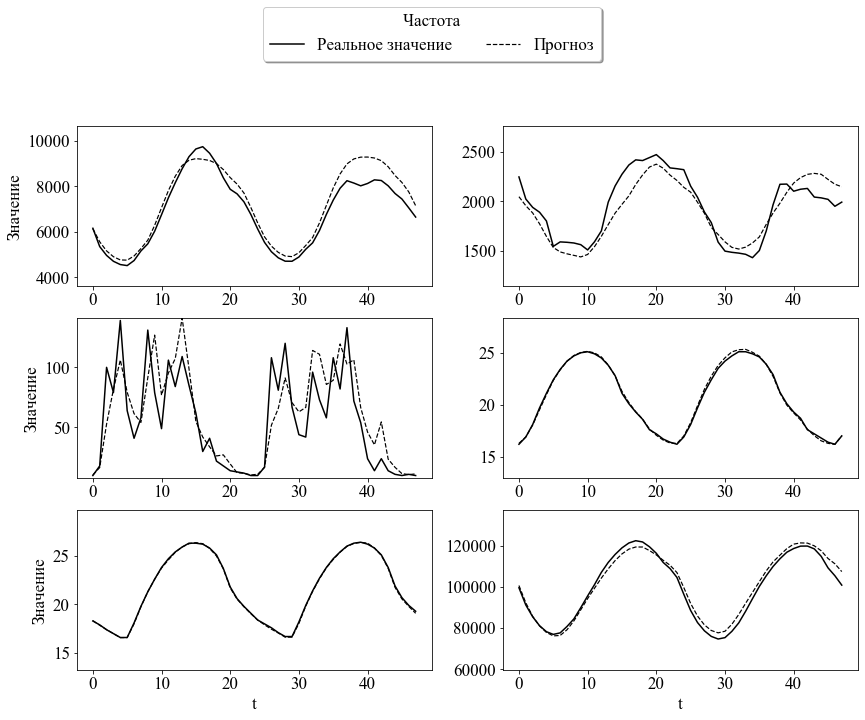

In [193]:
any_plot(h[1], hourly_preds1[0], scale_coef=5)

### Daily data

In [292]:
freq = 1

def day_model(train):
    return LocalModel(delay=1, dim=7, n_neighbors=40, n_next=14, reg=5, target='variate')

daily_preds1 = run_la(d[0], d[1], model=day_model, freq=freq, fuller=False, diff=True)

4226 row done. sMAPE: 3.043% MASE: 3.281

In [299]:
def day_model(train):
    return LocalModel(delay=1, dim=7, n_neighbors=40, n_next=14, reg=4, target='variate')

def day_autoreg(train):
    return AutoReg(train, lags=7)

daily_preds2 = run_la(d[0], d[1], model=day_model, freq=freq, fuller=False, diff=True, autoreg=day_autoreg, coef=[0.7, 0.3], h=14)

4226 row done. sMAPE: 2.965% MASE: 3.241

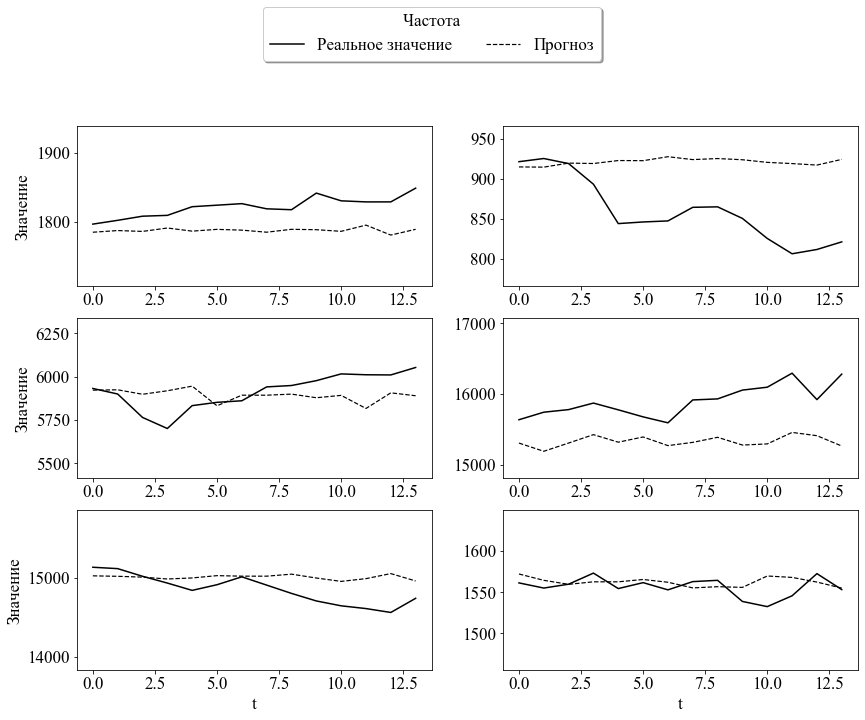

In [204]:
any_plot(d[1], daily_preds1[0], scale_coef=20)

### Weekly data

In [323]:
freq = 1

def week_model(train):
    return LocalModel(delay=3, dim=9, n_neighbors=40, n_next=13, reg=5, target='variate')

weekly_preds1 = run_la(w[0], w[1], model=week_model, freq=freq, diff=True, fuller=True)

358 row done. sMAPE: 8.122% MASE: 2.644

In [327]:
def week_model(train):
    return LocalModel(delay=3, dim=9, n_neighbors=20, n_next=13, reg=3, target='variate')

def week_autoreg(train):
    return AutoReg(train, lags=15)

weekly_preds2 = run_la(w[0], w[1], model=week_model, freq=freq, diff=True, fuller=True, autoreg=week_autoreg, coef=[0.4, 0.6], h=13)

358 row done. sMAPE: 7.499% MASE: 2.287

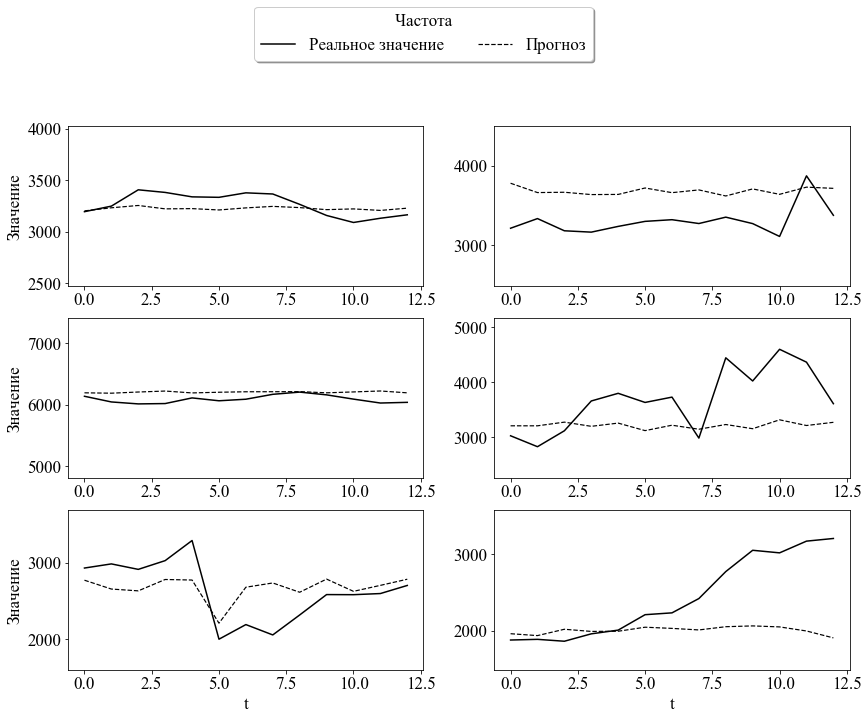

In [239]:
any_plot(w[1], weekly_preds1[0], scale_coef=5)

### Monthly data

In [331]:
freq = 12

def month_model(train):
    
    if train.size < 50:
        delay = 1
        dim = 3
        nn = 9
        reg = 5
        
    if train.size >= 50 and train.size < 100:
        delay = 1
        dim = 5
        nn = 10
        reg = 6
        
    if train.size >= 100:
        delay = 3
        dim = 6
        nn = 10
        reg = 6
        
    model = LocalModel(delay=delay, dim=dim, n_neighbors=nn, n_next=18, reg=reg, target='variate')
    return model

month_preds1 = run_la(m[0], m[1], model=month_model, freq=freq, diff=True, fuller=True)

47999 row done. sMAPE: 15.376% MASE: 1.199

In [340]:
def month_model(train):
    

    if train.size < 50:
        delay = 1
        dim = 2
        nn = 6
        reg = 5
        
    if train.size >= 50 and train.size < 100:
        delay = 1
        dim = 3
        nn = 8
        reg = 6
        
    if train.size >= 100:
        delay = 1
        dim = 5
        nn = 12
        reg = 6
        
    model = LocalModel(delay=delay, dim=dim, n_neighbors=nn, n_next=18, reg=reg, target='variate')
    return model

def month_autoreg(train):
    return AutoReg(train, lags=12, period=12, seasonal=True)

month_preds2 = run_la(m[0], m[1], model=month_model, autoreg=month_autoreg, freq=freq, diff=True, coef=[0.6, 0.4], h=18)

47999 row done. sMAPE: 13.872% MASE: 2.026

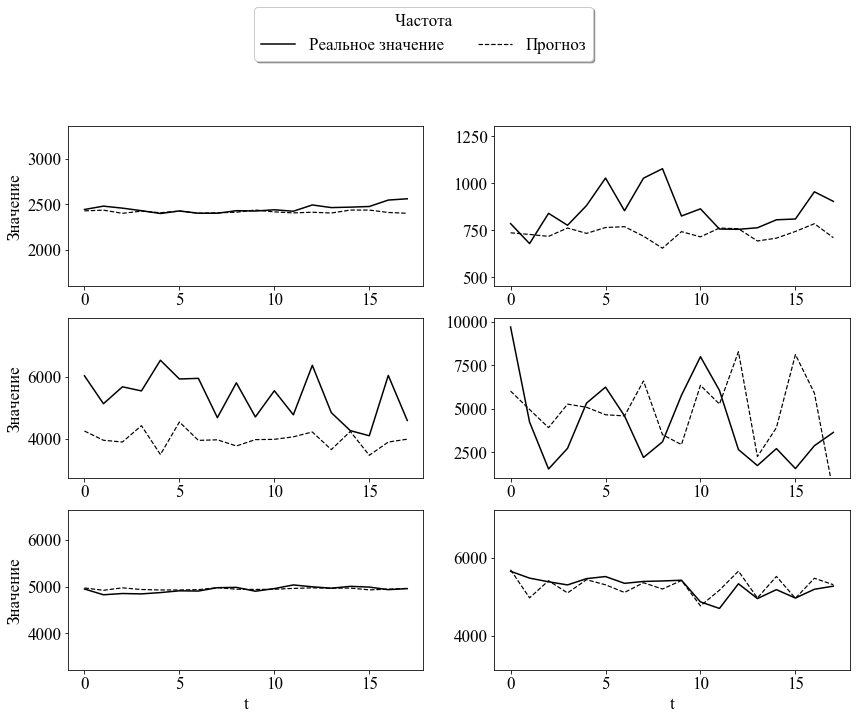

In [317]:
any_plot(m[1], month_preds[0], scale_coef=3)

In [347]:
freq = 4
def quart_model(train):
    
    if train.size < 20:
        delay = 1
        dim = 2
        nn = 4
        reg = 6
        
    if train.size >= 20 and train.size < 50:
        delay = 1
        dim = 2
        nn = 10
        reg = 6
        
    if train.size >= 50 and train.size < 200:
        delay = 2
        dim = 3
        nn = 15
        reg = 6
        
    if train.size >= 200:
        delay = 2
        dim = 7
        nn = 32
        reg = 6
        
    model = LocalModel(delay=delay, dim=dim, n_neighbors=nn, n_next=8, reg=reg, target='variate')
    return model

quart_preds1 = run_la(q[0], q[1], model=quart_model, freq=freq, diff=True, fuller=True)

23999 row done. sMAPE: 11.835% MASE: 1.425

In [352]:
def quart_model(train):
    if train.size < 20:
        delay = 1
        dim = 2
        nn = 4
        reg = 6
        
    if train.size >= 20 and train.size < 50:
        delay = 1
        dim = 3
        nn = 10
        reg = 6
        
    if train.size >= 50 and train.size < 200:
        delay = 2
        dim = 3
        nn = 10
        reg = 5
        
    if train.size >= 200:
        delay = 2
        dim = 3
        nn = 30
        reg = 3
        
    model = LocalModel(delay=delay, dim=dim, n_neighbors=nn, n_next=8, reg=reg, target='variate')
    return model

def quart_autoreg(train):
    return AutoReg(train, lags=5, period=4, seasonal=True)

quart_preds2 = run_la(q[0], q[1], model=quart_model, autoreg=quart_autoreg, freq=freq, diff=True, fuller=True, coef=[0.5, 0.5], h=8)

23999 row done. sMAPE: 10.893% MASE: 1.246

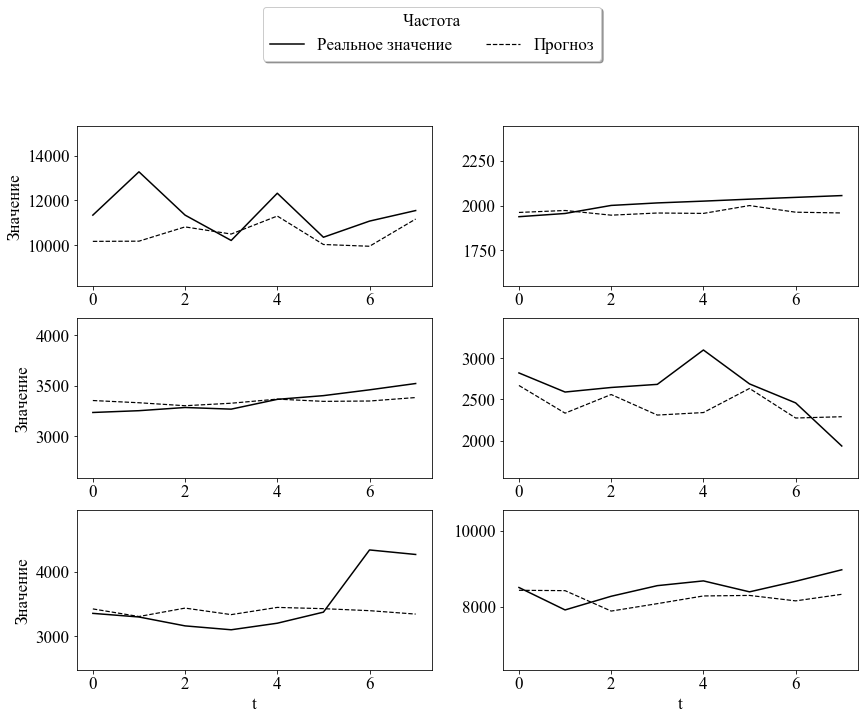

In [334]:
any_plot(q[1], quart_preds[0], scale_coef=5)

In [366]:
freq = 1

def year_model(train):
    if train.size < 20:
        delay = 1
        dim = 2
        nn = 4
        reg = 6
        
    if train.size >= 20 and train.size < 50:
        delay = 1
        dim = 3
        nn = 12
        reg = 5
        
    if train.size >= 50 and train.size < 200:
        delay = 1
        dim = 5
        nn = 35
        reg = 6
        
    if train.size >= 200:
        delay = 1
        dim = 5
        nn = 40
        reg = 7
        
    model = LocalModel(delay=delay, dim=dim, n_neighbors=nn, n_next=6, reg=reg, target='variate')
    return model

year_preds1 = run_la(y[0], y[1], model=year_model, freq=freq, diff=True, fuller=False)

22999 row done. sMAPE: 15.529% MASE: 3.567

In [402]:
def year_model(train):
    if train.size < 20:
        delay = 1
        dim = 2
        nn = 4
        reg = 4
        
    if train.size >= 20 and train.size < 50:
        delay = 1
        dim = 2
        nn = 12
        reg = 5
        
    if train.size >= 50 and train.size < 200:
        delay = 2
        dim = 5
        nn = 26
        reg = 6
        
    if train.size >= 200:
        delay = 2
        dim = 5
        nn = 35
        reg = 7
        
    model = LocalModel(delay=delay, dim=dim, n_neighbors=nn, n_next=6, reg=reg, target='variate')
    return model

def year_autoreg(train):
    return AutoReg(train, lags=1)

year_preds2 = run_la(y[0], y[1], model=year_model, autoreg=year_autoreg, freq=freq, diff=False, fuller=False, coef=[0.2, 0.8], h=6)

22999 row done. sMAPE: 15.104% MASE: 3.466

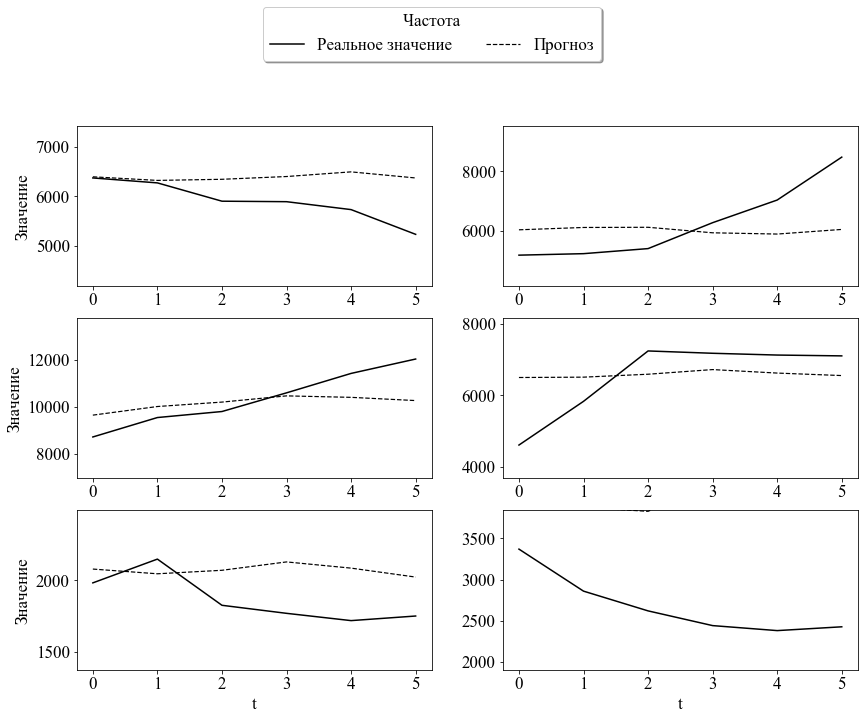

In [357]:
any_plot(y[1], year_preds[0], scale_coef=5)

In [403]:
(np.sum(hourly_preds1[1]) + np.sum(daily_preds1[1]) + np.sum(weekly_preds1[1]) + np.sum(month_preds1[1]) + np.sum(quart_preds1[1]) + np.sum(year_preds1[1]))/100000

13.997884936689548

In [404]:
(np.sum(hourly_preds2[1]) + np.sum(daily_preds2[1]) + np.sum(weekly_preds2[1]) + np.sum(month_preds2[1]) + np.sum(quart_preds2[1]) + np.sum(year_preds2[1]))/100000

12.944582509069413

In [406]:
(np.sum(hourly_preds1[2]) + np.sum(daily_preds1[2]) + np.sum(weekly_preds1[2]) + np.sum(month_preds1[2]) + np.sum(quart_preds1[2]) + np.sum(year_preds1[2]))/100000

1.8910710596631055

In [407]:
(np.sum(hourly_preds2[2]) + np.sum(daily_preds2[2]) + np.sum(weekly_preds2[2]) + np.sum(month_preds2[2]) + np.sum(quart_preds2[2]) + np.sum(year_preds2[2]))/100000

2.21782817221837

In [408]:
(15.529 + 11.835 + 15.376 + 8.112 + 3.043 + 11.428)/6

10.887166666666667